# SkinAnaliticAI, Skin Cancer Detection with AI Deep Learning

## __Evaluation of Harvard Dataset with different AI classiffication techniques using PyClass AI workbench__
Author: __Pawel Rosikiewicz__   
prosikiewicz@gmail.com      
License: __MIT__    
ttps://opensource.org/licenses/MIT        
Copyright (C) 2021.01.30 Pawel Rosikiewicz  

## Notebook: EXPLORATORY DATA ANALYSIS OF THE HAM10000 DATASET
---
* Goals
     * 1. To answer following questions
         * what is the composition of the dataset?
         * does different classes have similar size? 
         * can we find hidden subclasses, and if yes, are they well represented, 
         * are there some obvious problems with the dataset
         * do I have sufficient number of images for making image classyfication
         * why some classes are imbalanced (if they are)            
                            
     * 2. To plot image examples from each class
        * done on several occasion in the above
                     
     * 3. Technical Exploration  
        * to compare results of feature extraction using
                * hierarchical clustering with examples, 
                * PCA
        * to understand what preprocessing steps, can be required to bild the most optimal baseline, tranfer learning and deep learnign models,   

#### standard imports

In [1]:
import os # allow changing, and navigating files and folders, 
import sys
import shutil
import re # module to use regular expressions, 
import glob # lists names in folders that match Unix shell patterns
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
warnings.filterwarnings("ignore")

In [2]:
# setup basedir
basedir = os.path.dirname(os.getcwd())
os.chdir(basedir)
sys.path.append(basedir)

# project paths
PATH_raw                            = os.path.join(basedir, "data/raw")
PATH_interim                        = os.path.join(basedir, "data/interim")
PATH_models                         = os.path.join(basedir, "models")
PATH_interim_dataset_summary_tables = os.path.join(PATH_interim, "dataset_summary_tables")

## Data Preparation with PyClass

> current example can be run as is, all configs and data were already prepared for You
> If you would like to create `your own project wiht PyClass`, or add new models and conditions to that project, you need need to start with project_suetup steps 1-3, that were described in separate notebooks, see `project_setup/01 - 03 ... notebooks`

### __PROJECT SETUP__

* __01. Create or modify PyClass configs__
    * detailed instructions are also in the `project_setup/01_Setup` notebook
    * each config file contains intrsuctions, on how to create them, 
    * the configs, will control, all the functions used in notebooks, except for the `functions used for data presentaiton, and results summary`
        * these functions, have all parameters described in help(<function_name>)
    * all functions, have extensive help function that I encourage you to check.

  
* __02. Data Preparation__
    * Data preparation, using PyClass functions was done in`project_setup/02_a-c... notebooks`
    * it includes, donwloading the images fron Harvard dataverse, or Kaggle, (links are in notebooks)
    * cleaning, the images, and organizing in train/test/valid folders, with separate folders containg images from each class, named after class name
    * dividing large dataset into smaller subsets, or 
    * __Caution__ data used for de-novo cnn models, are not divided into smaller subsets, these are kept in one folder to allow keras image generators creating augmented images, while trainign the model,
 
 
   
* __03. Feature extraction__
    * PyClass provides you with two options, You may either use `ne-novo cnn networks` for classyficaiton of images, or you may use `keras and skilearn models`, on extracted features with pretrained convolutional networks, downloaded from tf-hub, or other location.
    * to extract features follwo the instructions in `project_setup/02_a-c... notebook`
    * models: 
        * option 1. you may use url, that needs to be added to `model_configs`
        * option 2. you may donwload the model to `model/` directory, and use them with the same function
   

In [3]:
# load functions
from src.utils.new_data_loaders import pair_files
from src.utils.FastClassAI_eda_tools import cluster_images_and_plot_examples
from src.utils.FastClassAI_eda_tools import pca_analysis_on_plots
from src.utils.FastClassAI_eda_tools import plot_n_image_examples
from src.utils.FastClassAI_eda_tools import annotated_piecharts_with_subset_class_composition


# load configs
from src.configs.project_configs import PROJECT_NAME
from src.configs.project_configs import CLASS_DESCRIPTION # information on each class, including descriptive class name and diegnostic description - used to help wiht the project
from src.configs.tfhub_configs import TFHUB_MODELS # names of TF hub modules that I presenlected for featuress extraction with all relevant info,
from src.configs.dataset_configs import DATASET_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import CLASS_LABELS_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import DROPOUT_VALUE # str, special value to indicate samples to remoce in class labels
from src.configs.config_functions import DEFINE_DATASETS # function that creates datasunbsets collections for one dataset (custome made for that project)

# project and task configs
DATASET_NAME       = "HAM10000"  # name used in config files to identify all info on that dataset variant
DATASET_VARIANTS   = DATASET_CONFIGS[DATASET_NAME]["labels"] # class labels that will beused, SORT_FILES_WITH   must be included
SUBSET_NAMES       = ["train", "valid", "test", "test_2"] # to plot dataset composition, re-gegex used to identify label files form either all or speciffic batches, eg train, test or valid_01
BATCH_NAME         = "train_01" # used to display image examples - full batch name that will be loaded, 
SUBSET_COMPOSITION, DATA_SUBSET_ROLES = DEFINE_DATASETS( 
    dataset_name      = DATASET_NAME,
    dataset_variants  = DATASET_VARIANTS,
    module_names      = list(TFHUB_MODELS.keys()),
    path              = PATH_interim
    )# missing module name is the most outer layer, 

## Check what is the class composition in each subset in each dataset variant
* in project steup, we created two `dataset variants` with the same images, 
    * __Cancer Detection and Classyfication__ : a model with 7 classes of images, including 5 classes of cancer)
    * __Cancer Risk Groups__ : a model with 3 classes, goruping the same images, into three right groups of malignous cancer (High Medium, and Low), see image below
* subsequently, each dataset varinat was divivided into __train/valid/and test 1 test 2 subsets__, 
* here we will __plot__ the number of images in each class, each subset from each dataset variant
    * it is important to see whther the %, or the raw number of images in each subset is as we wanted
    * and, if the ratio of images from different classes is the same, in each subset of a given dataset varinat
        * `Caution` dataset variants may have different composition of the images from different classes, in case we address the problme of imbalanced classes, 
        * this was done, in full version available on full version of the research, where the train data had more balanced dataset (undersamplling of the green class), whereas test and valid dataset haven't, in order to get get statistics corresponding to results expected in real life patient examination. 
        

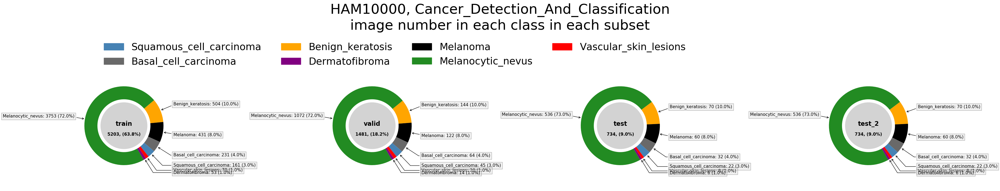

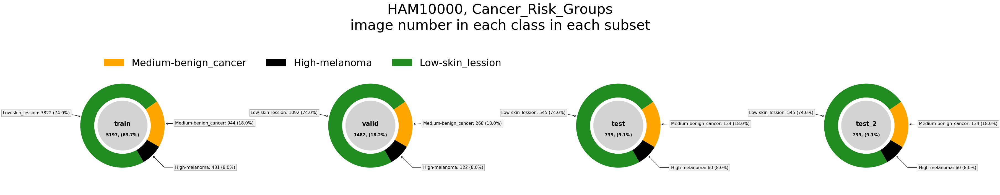

In [4]:
for dataset_variant in DATASET_VARIANTS:
    annotated_piecharts_with_subset_class_composition(                                            
        # data and title
        plot_title             = f"{DATASET_NAME}, {dataset_variant}\nimage number in each class in each subset",
        subset_names           = SUBSET_NAMES,           # name of one batch, or list with name sof several batches,
        class_labels_colors    = CLASS_LABELS_CONFIGS[dataset_variant]['class_labels_colors'],

        # required to find logfiles, 
        path                   = PATH_interim,                         # eg PATH_interim, where you store both  
        dataset_name           = DATASET_NAME,                         # required, for path and naming
        dataset_variant        = dataset_variant,                      # required, for path and naming
        module_name            = list(TFHUB_MODELS.keys())[0],         # any module used for feature extraction is ok

        # fig aestetics, 
        n_subplots_in_row      = len(SUBSET_NAMES),
        figsize_scale          = 1.8,
        fontsize_scale         = 1,
        legend_loc             = (0.1,0.63),
        legend_ncol            = 4
    )

## Plot image examples from each class in each dataset variant

Found 742 images belonging to 7 classes.


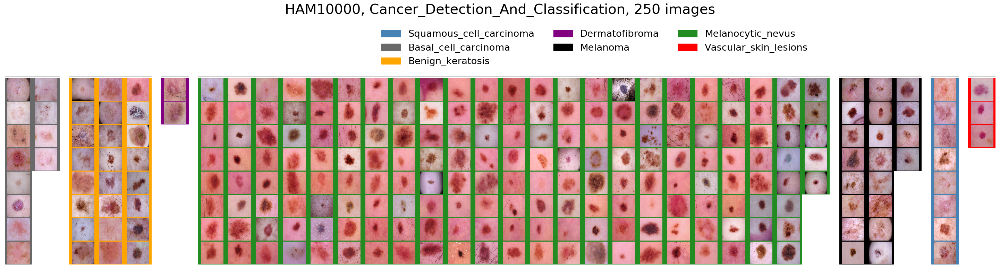

Found 741 images belonging to 3 classes.


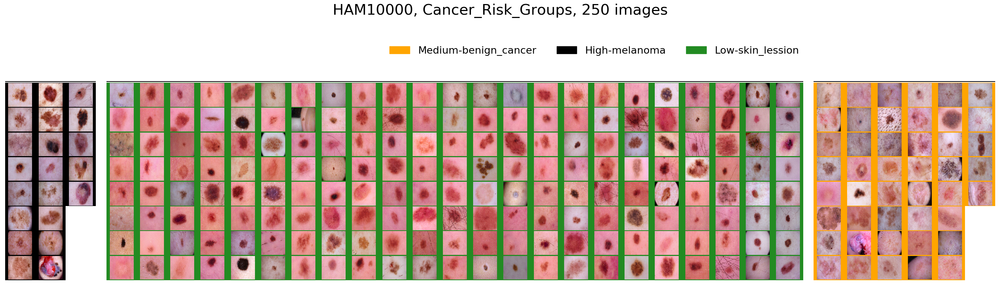

In [5]:
for dataset_variant in DATASET_VARIANTS:
    plot_n_image_examples(
            n = 250, 
            path = PATH_interim,                # eg PATH_interim, where you store both  
            dataset_name = DATASET_NAME,        # required, for path and naming
            dataset_variant = dataset_variant,     # required, for path and naming
            module_name = list(TFHUB_MODELS.keys())[0],         # any module used for feature extraction is ok
            batch_name = BATCH_NAME,          # name of one batch, or list with name sof several batches,
            class_labels_colors= CLASS_LABELS_CONFIGS[dataset_variant]['class_labels_colors'], # dict key: classname, value: color
            use_fastclassai_labels=False,
            img_size =(100, 100),
            figsize_scaling=1.2,
            font_scaling = 0.8,
            legend_pos_to_left =0.1,
            max_img_per_col=None                       
    )

## Plot image examples clustered with extracted features 

Found 742 images belonging to 7 classes.


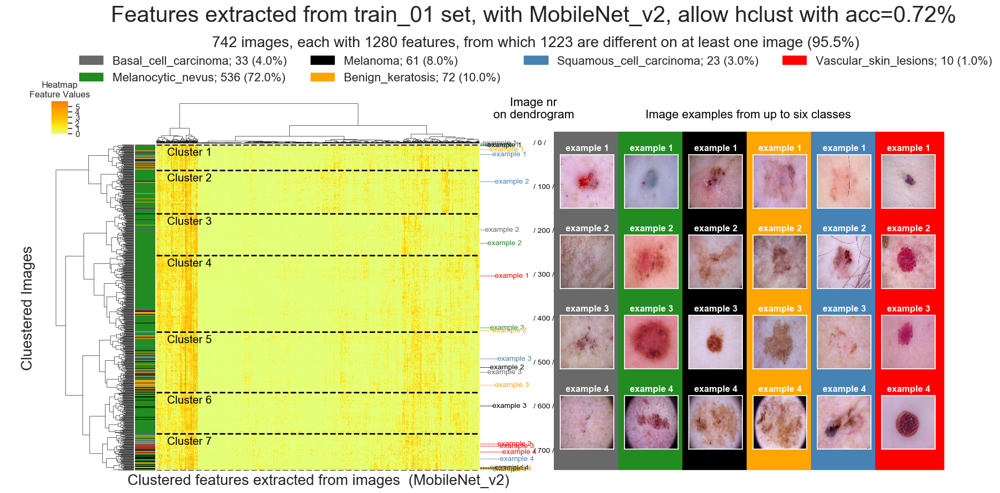

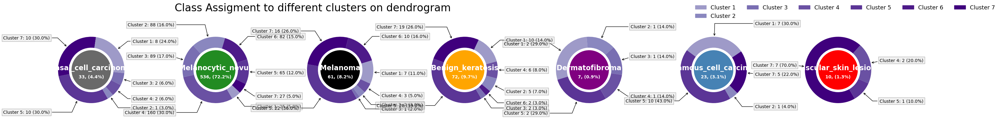

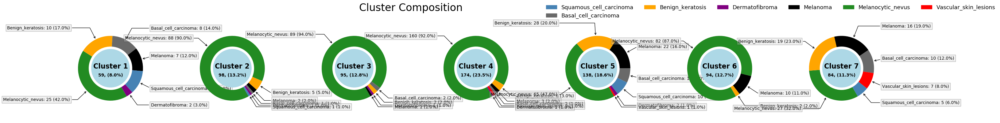

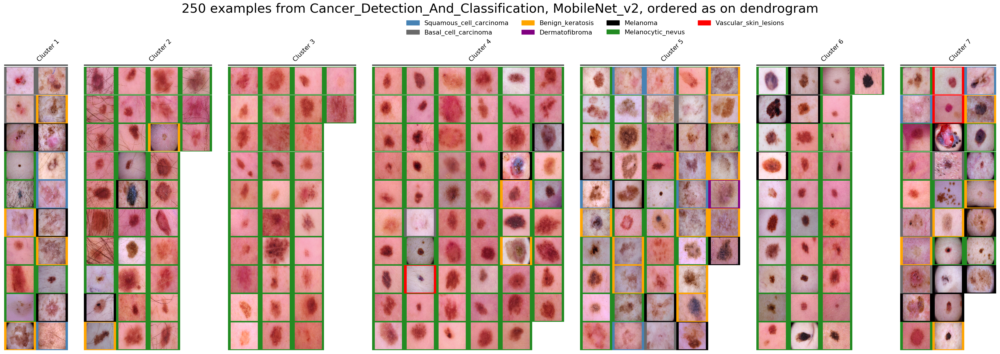

In [6]:
cluster_images_and_plot_examples(
    path                   = PATH_interim, # str
    batch_names            = [BATCH_NAME], # list, if >1, they will be joined and displayed togther
    dataset_name           = DATASET_NAME, # str
    dataset_variants       = [DATASET_VARIANTS[0]], # list
    module_names           = [list(TFHUB_MODELS.keys())[0]], # assuming all dataset/dataset varinats were treated with the same combinaiton of tfmodules
    class_labels_configs   = CLASS_LABELS_CONFIGS, # dict with dict
    n_img_examples         = 250, # int
    max_img_per_col        = 10, # int
    figsize_scaling        = 1.5 # float
)

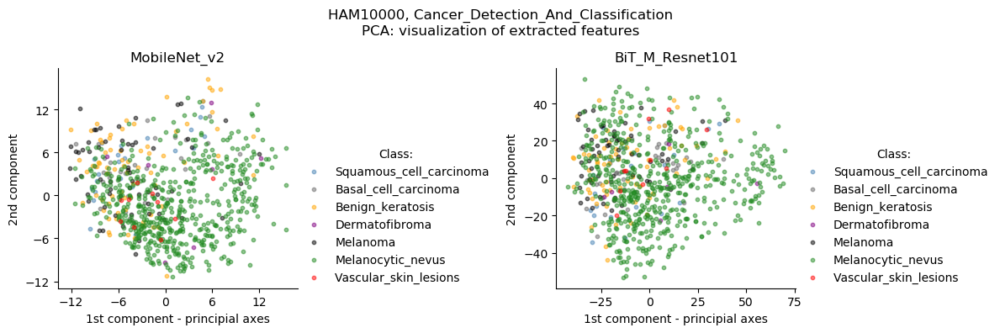

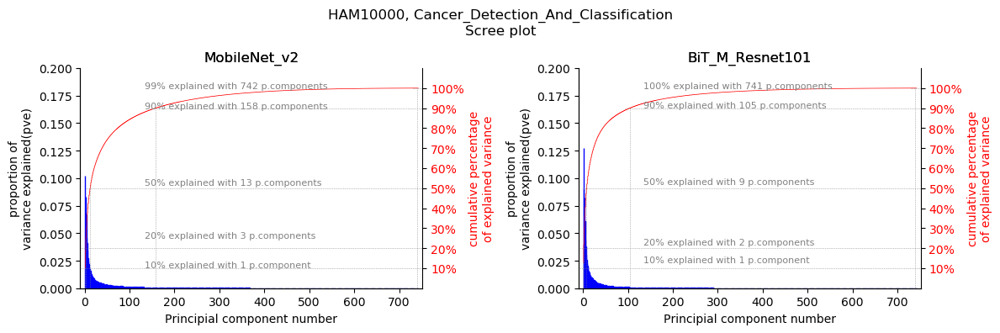

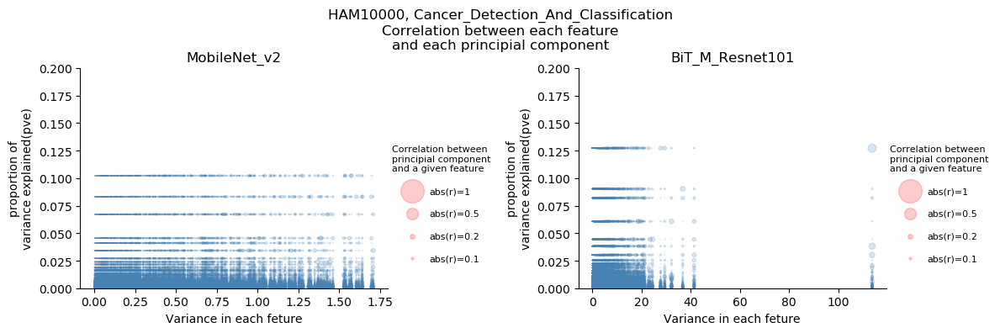

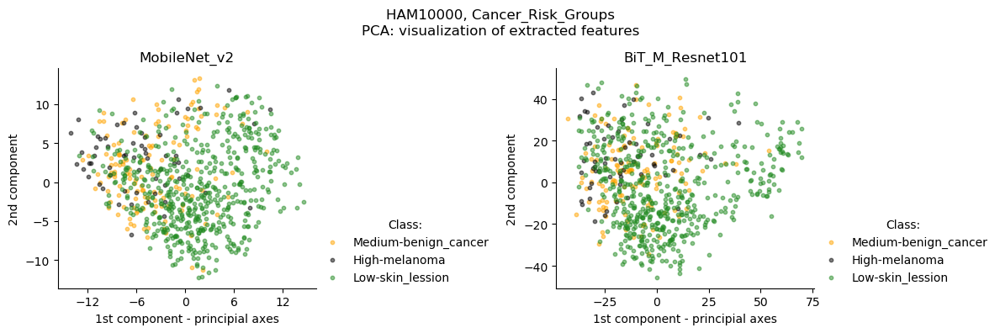

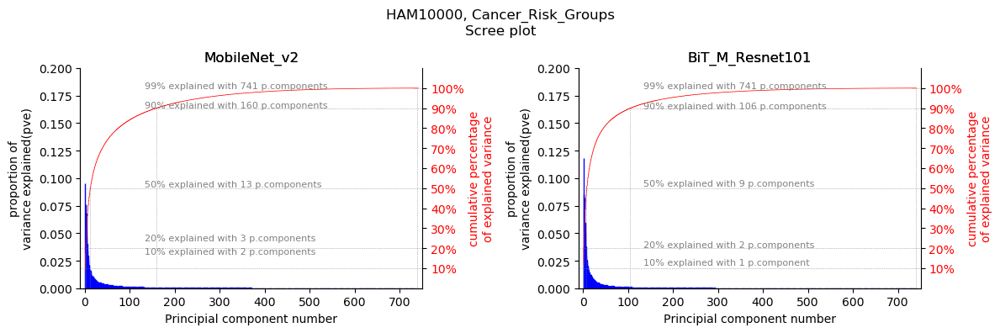

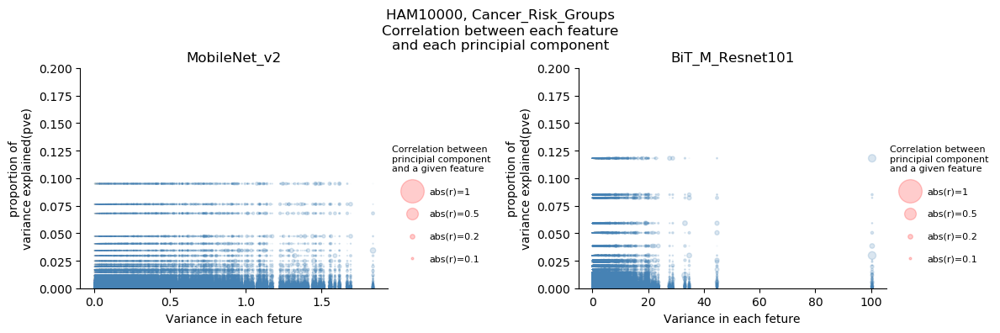

In [8]:
pca_analysis_on_plots(
    path                   = PATH_interim,
    batch_names            = [BATCH_NAME], # if >1, they will be joined and displayed togther
    dataset_name           = DATASET_NAME,
    dataset_variants       = DATASET_VARIANTS,
    module_names           = list(TFHUB_MODELS.keys()), # assuming all dataset/dataset varinats were treated with the same combinaiton of tfmodules
    class_labels_configs   = CLASS_LABELS_CONFIGS,
    pca_figsize            = (12,4), # tuple (row lengh, row height)
    pca_axes_max_nr        = 250, 
    verbose                = False,
    scale_data             = False
)

# check how many images were assigned to train, test and validation datasets

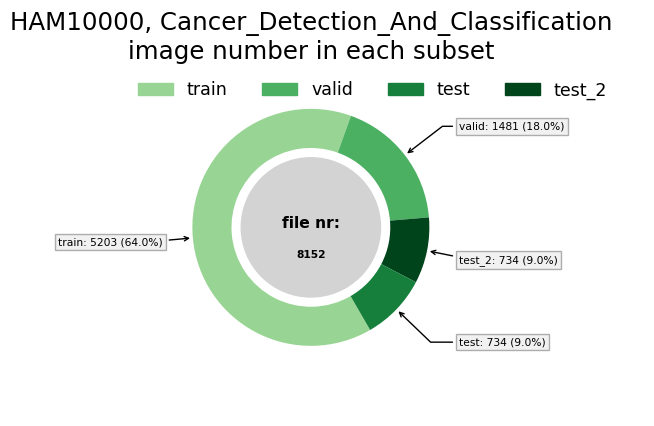

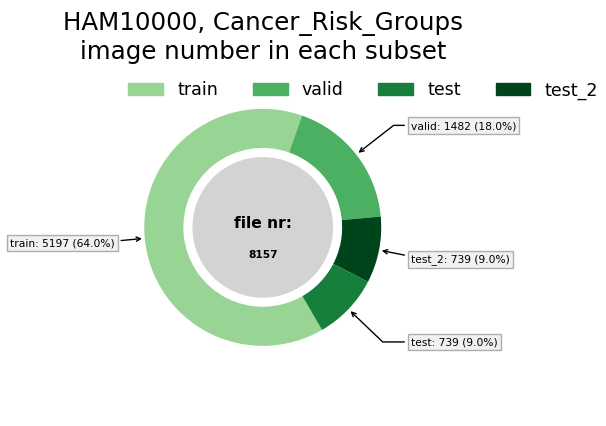

In [9]:
for dataset_variant in DATASET_VARIANTS:
    annotated_piecharts_with_subset_class_composition(                                            
        # data and title
        plot_title             = f"{DATASET_NAME}, {dataset_variant}\nimage number in each subset",
        subset_names           = SUBSET_NAMES,           # name of one batch, or list with name sof several batches,
        plot_class_composition = False, # option in which the function plots one pie chart with image nr in each subset

        # required to find logfiles, 
        path                   = PATH_interim,                         # eg PATH_interim, where you store both  
        dataset_name           = DATASET_NAME,                         # required, for path and naming
        dataset_variant        = dataset_variant,                      # required, for path and naming
        module_name            = list(TFHUB_MODELS.keys())[0],         # any module used for feature extraction is ok

        # fig aestetics, 
        figsize_scale          = 1,
        figheight_scale        = 1,
        fontsize_scale         = 0.7,
        title_fontsize_scale   = 0.7,
        legend_loc             = (0.2,0.75),
        class_colors_cmap      = "Greens",
    )    